# Transform Consistency Loss

In [1]:
import pathlib
import tempfile

import torch
import torchvision
import torch.nn.functional as F

import numpy as np
import matplotlib.pyplot as plt
import roma
import tqdm

from Unet2 import UNet
from se3 import se3_log_map, se3_exp_map
from functorch import jacfwd
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [2]:
device

device(type='cuda', index=0)

## Extrinsic Representations

We need to work in at least 3 representations of extrinsic matrices for this problem.

1. Rigid body transforms in $SE(3)$ tangent space are represented as a `transform` matrix
2. Rotation matrices in $SO(3)$ tangent space translation vectors are represented as a `pose` tuple
3. The 6 degrees of freedom are represented as a vector of `params`

These are all isomorphisms, and below we define functions for converting between these different representations.

In [3]:
def transform_from_params(params):
    return se3_exp_map(params).mT

In [4]:
def params_from_transform(transform):
    return se3_log_map(transform.mT)

In [5]:
def pose_from_transform(transform):
    return transform[..., :3, :3], transform[..., :3,[3]]

## Data Loader

A good dataloader should read files from the disk and not use too much memory.

Unfortunately, the large dataset that Oli supplied is compressed in `npz` format, and must be uncompressed first before it can be used. Our strategy will be to load the file, then write it out as a temporary `memmap`'d file which can be indexed without needing to read the whole file into memory.

In [124]:
def load_data_as_memmap(filename, directory):
    directory = pathlib.Path(directory)
    dataset = np.load(filename)
        
    output = {
        'K': dataset['K'],
        'transforms': dataset['transforms'],
    }
    
    # Send the RGB & depth data to a file on disk to avoid OOM
    for key in ('rgbs', 'depths'):
        data = dataset[key]
        filename = directory / f'{key}.npy'
        fp = np.memmap(filename, dtype='float32', mode='w+', shape=data.shape)
        fp[:] = data[:]
        output[key] = np.memmap(filename, dtype='float32', mode='r', shape=data.shape)
    return output

In [125]:
memmap = load_data_as_memmap('data-2023-03-03.npz', tempfile.mkdtemp())

In [7]:
class CarlaTriplesDataset(torch.utils.data.Dataset):
    
    def __init__(self, dataset):
        self.K = torch.from_numpy(dataset['K']).float()
        self.K[0] = self.K[0] / 800
        self.K[1] = self.K[1] / 600
        self.rgbs = dataset['rgbs']
        self.depths = dataset['depths']
        self.transforms = dataset['transforms']

    def __len__(self):
        # The size of the dataset should be the number of triples
        # We will assume that each query image uses its adjacent images,
        # so we have N - 2 query images
        return len(self.transforms) - 2

    def __getitem__(self, idx):
        # Our query images in CHW format
        # Note for Yuxin: The images needed to be divided by 255!
        image_0 = torch.from_numpy(self.rgbs[idx+0].copy()).permute(2, 0, 1) / 255
        image_q = torch.from_numpy(self.rgbs[idx+1].copy()).permute(2, 0, 1) / 255
        image_1 = torch.from_numpy(self.rgbs[idx+2].copy()).permute(2, 0, 1) / 255
        # Our depth images i
        depth_0 = torch.from_numpy(self.depths[idx+0].copy() * 1000)
        depth_q = torch.from_numpy(self.depths[idx+1].copy() * 1000)
        depth_1 = torch.from_numpy(self.depths[idx+2].copy() * 1000)

        # Deal with the handness difference between intrinsic and carla extrinsic
        # The mapping is x, y, z -> -z, x, y
        axes = torch.tensor([
            [0, 0,-1, 0],
            [1, 0, 0, 0],
            [0, 1, 0, 0],
            [0, 0, 0, 1],
        ]).double()
        
        # Our poses
        extrinsic_0 = torch.from_numpy(self.transforms[idx+0]) @ axes
        extrinsic_q = torch.from_numpy(self.transforms[idx+1]) @ axes
        extrinsic_1 = torch.from_numpy(self.transforms[idx+2]) @ axes
        
        transform_0q = torch.linalg.inv(extrinsic_0) @ extrinsic_q
        transform_1q = torch.linalg.inv(extrinsic_1) @ extrinsic_q
        transform_10 = torch.linalg.inv(extrinsic_1) @ extrinsic_0
        
        #transformation: resize from 600*800 to 120 160
        # resize = torchvision.transforms.Resize((120,160))
        def resize(x):
            # return x
            # return torchvision.transforms.functional.resize(x, (450, 600), antialias=True)
            return torchvision.transforms.functional.resize(x, (225, 300), antialias=True)
        
        return (
            self.K.unsqueeze(0),
            resize(image_q),
            resize(image_0),
            resize(image_1),
            resize(depth_q.unsqueeze(0)).squeeze(),
            resize(depth_0.unsqueeze(0)).squeeze(),
            resize(depth_1.unsqueeze(0)).squeeze(),
            transform_0q.float(),
            transform_1q.float(),
            transform_10.float(),
        )
        # return self.K.unsqueeze(0),image_q,image_0,image_1,depth_q,depth_0,depth_1,pose_q0, pose_q1, pose_01
        # return self.K.unsqueeze(0), torchvision.transforms.functional.resize(image_q,(60,120)), torchvision.transforms.functional.resize(image_0,(60,120)), torchvision.transforms.functional.resize(image_1,(60,120)), torchvision.transforms.functional.resize(depth_q,(60,120)), torchvision.transforms.functional.resize(depth_0,(60,120)), torchvision.transforms.functional.resize(depth_1,(60,120)), pose_q0, pose_q1, pose_01

In [8]:
test_rain_dynamics = CarlaTriplesDataset(np.load("testset/test_rain_dynamics_417.npz")) 
test_rain_nodynamics = CarlaTriplesDataset(np.load("testset/test_rain_noDynamics_417.npz"))
test_sunny_dynamics = CarlaTriplesDataset(np.load("testset/test_sunny_dynamics_417.npz"))
test_sunny_nodynamics = CarlaTriplesDataset(np.load("testset/test_sunny_noDynamics_417.npz"))

dataloader_rain_dynamics = torch.utils.data.DataLoader(test_rain_dynamics, batch_size=1, shuffle=False)
dataloader_rain_nodynamics = torch.utils.data.DataLoader(test_rain_nodynamics, batch_size=1, shuffle=False)
dataloader_sunny_dynamics = torch.utils.data.DataLoader(test_sunny_dynamics, batch_size=1, shuffle=False)
dataloader_sunny_nodynamics = torch.utils.data.DataLoader(test_sunny_nodynamics, batch_size=1, shuffle=False)

In [128]:
K, image_q, image_0, image_1, depth_q, depth_0, depth_1, transform_0q, transform_1q, transform_10 = dataset[5]

torch.allclose(transform_0q, transform_from_params(params_from_transform(transform_0q.unsqueeze(0))))

True

In [129]:
K

tensor([[[0.5000, 0.0000, 0.5000],
         [0.0000, 0.6667, 0.5000],
         [0.0000, 0.0000, 1.0000]]])

### Testing the DataLoader

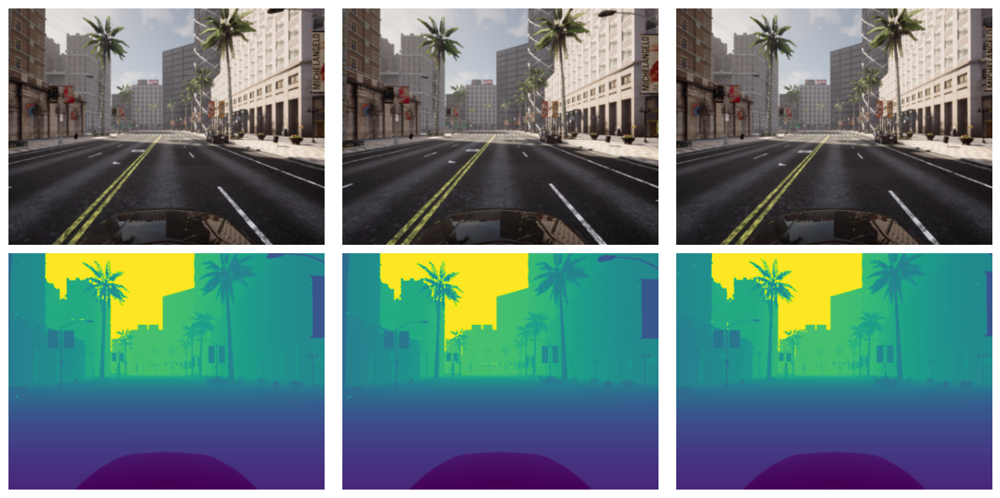

In [130]:
K, image_q, image_0, image_1, depth_q, depth_0, depth_1, transform_0q, transform_1q, transform_10 = dataset[5]

fig, axs = plt.subplots(2, 3, figsize=(12, 6))
for ax in axs.ravel():
    ax.axis('off')
axs[0, 0].imshow(image_q.permute(1, 2, 0))
axs[0, 1].imshow(image_0.permute(1, 2, 0))
axs[0, 2].imshow(image_1.permute(1, 2, 0))
axs[1, 0].imshow(torch.log(depth_q))
axs[1, 1].imshow(torch.log(depth_0))
axs[1, 2].imshow(torch.log(depth_1))
plt.tight_layout()
plt.show()

## Perspective Geometry

In [9]:
def apply_transform(points, transform):
    """
    Project points to camera reference frame
    """
    R, t = transform[..., :3, :3], transform[..., :3, [3]]
    return R @ points + t

In [10]:
def perspective(points, epsilon=1e-8):
    """
    Perspective division
    """
    return points[..., :-1, :] / (points[..., [-1], :] + epsilon)

In [11]:
def project(points, K, height, width):
    """
    Project 3D points into a 2D image with intrinsic matrix K
    """
    coords = K @ points
    coords = perspective(coords)
    coords = coords.view(-1, height, width, 2)
    coords = (coords - 0.5) * 2
    return coords

In [12]:
def backproject(depth, K):
    """
    Backproject a depth map into 3D space with normalized intrinsic matrix K.
    The depth map should be normalized between (min_depth, max_depth).
    """
    height, width = depth.shape[-2:]
    size = height * width
    y = torch.linspace(0, 1, height, device=depth.device, dtype=depth.dtype)
    x = torch.linspace(0, 1, width,  device=depth.device, dtype=depth.dtype)
    u, v = torch.meshgrid(x, y, indexing='xy')
    ones = torch.ones(size, device=depth.device)
    points = torch.column_stack([u.ravel(), v.ravel(), ones]).view(-1, size, 3, 1)
    points = torch.linalg.inv(K) @ points
    return points * depth.view(-1, size, 1, 1)

In [13]:
def pix_coords(height, width, device):
    """
    Create a grid of camera pixels in normalized device coordinates
    """
    size = height * width
    y = torch.linspace(-1, 1, height, device=device)
    x = torch.linspace(-1, 1, width, device=device)
    u, v = torch.meshgrid(x, y, indexing='xy')
    ones = torch.ones(size, device=device)
    return torch.column_stack([u.ravel(), v.ravel(), ones]).view(-1, size, 3, 1)

In [14]:
def warp(homography, image, padding_mode="border"):
    """
    Warp an image using homography
    """
    height, width = image.shape[-2:]
    coords = pix_coords(height, width, device=device)
    warped = project(homography @ coords, height, width)
    warped = F.grid_sample(image, warped, padding_mode=padding_mode, align_corners=False)
    return warped

In [15]:
def grid_sample(image, flow):
    """
    Hacky implementation of torch.nn.functional.grid_sample,
    created so that the derivative can be computed with jacfwd.
    """
    N, C, IH, IW = image.shape
    _, H, W, _ = flow.shape

    ix = flow[..., 0]
    iy = flow[..., 1]

    ix = ((ix + 1) / 2) * (IW-1);
    iy = ((iy + 1) / 2) * (IH-1);
    
    with torch.no_grad():
        ix_nw = torch.floor(ix);
        iy_nw = torch.floor(iy);
        ix_ne = ix_nw + 1;
        iy_ne = iy_nw;
        ix_sw = ix_nw;
        iy_sw = iy_nw + 1;
        ix_se = ix_nw + 1;
        iy_se = iy_nw + 1;

    nw = (ix_se - ix)    * (iy_se - iy)
    ne = (ix    - ix_sw) * (iy_sw - iy)
    sw = (ix_ne - ix)    * (iy    - iy_ne)
    se = (ix    - ix_nw) * (iy    - iy_nw)

    with torch.no_grad():
        ix_nw = torch.clamp(ix_nw, 0, IW-1)
        iy_nw = torch.clamp(iy_nw, 0, IH-1)
        ix_ne = torch.clamp(ix_ne, 0, IW-1)
        iy_ne = torch.clamp(iy_ne, 0, IH-1)
        ix_sw = torch.clamp(ix_sw, 0, IW-1)
        iy_sw = torch.clamp(iy_sw, 0, IH-1)
        ix_se = torch.clamp(ix_se, 0, IW-1)
        iy_se = torch.clamp(iy_se, 0, IH-1)

    image = image.view(N, C, IH * IW)

    nw_val = torch.gather(image, 2, (iy_nw * IW + ix_nw).long().view(N, 1, H * W).repeat(1, C, 1))
    ne_val = torch.gather(image, 2, (iy_ne * IW + ix_ne).long().view(N, 1, H * W).repeat(1, C, 1))
    sw_val = torch.gather(image, 2, (iy_sw * IW + ix_sw).long().view(N, 1, H * W).repeat(1, C, 1))
    se_val = torch.gather(image, 2, (iy_se * IW + ix_se).long().view(N, 1, H * W).repeat(1, C, 1))

    return (
        nw_val.view(N, C, H, W) * nw.view(N, 1, H, W) +    
        ne_val.view(N, C, H, W) * ne.view(N, 1, H, W) +       
        sw_val.view(N, C, H, W) * sw.view(N, 1, H, W) +
        se_val.view(N, C, H, W) * se.view(N, 1, H, W)
    )

In [16]:
def resample(depth, K, transform, target):
    """
    Backproject a depth map with K and transform it into a new reference frame T.
    Sample colors from the target image.
    """
    points_3d = backproject(depth, K)
    points_3d = apply_transform(points_3d, transform)
    points_2d = project(points_3d, K, depth.shape[-2], depth.shape[-1])
    return grid_sample(target, points_2d)

### Testing Perspective Geometry

Let's see if we can project image_0 into image_1.

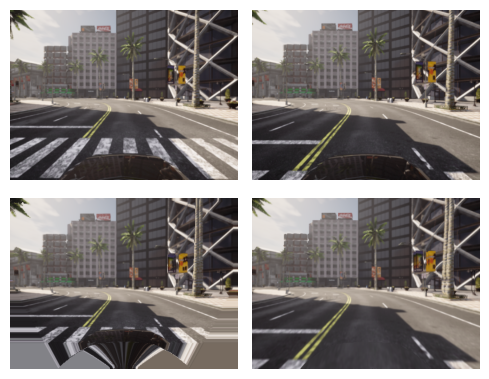

In [139]:
K, image_q, image_0, image_1, depth_q, depth_0, depth_1, transform_0q, transform_1q, transform_10 = dataset[71]  # 71, 65, 21, 5

image_q0 = resample(depth_0, dataset.K, transform_0q, image_q.unsqueeze(0)).squeeze()
image_q1 = resample(depth_1, dataset.K, transform_1q, image_q.unsqueeze(0)).squeeze()

fig, axs = plt.subplots(2, 2, figsize=(5, 4))
for a in axs.ravel():
    a.axis('off')
axs[0, 0].imshow(image_0.permute(1,2,0))
axs[0, 1].imshow(image_1.permute(1,2,0))
axs[1, 0].imshow(image_q0.permute(1,2,0))
axs[1, 1].imshow(image_q1.permute(1,2,0))
plt.tight_layout()
plt.show()

## Gauss-Newton

In [101]:
class GaussNewtonImageOptimizer(torch.nn.Module):
    
    def __init__(self, K, image, depth):
        super().__init__()
        self.K = K
        self.image = image
        self.depth = depth

        # self.residuals_grad = torch.func.jacfwd(self.residuals)
        self.residuals_grad = jacfwd(self.residuals)
        
    def residuals(self, params, target):
        transform = transform_from_params(params).unsqueeze(1)
        resampled = resample(self.depth, self.K, transform, target)
        residuals = self.image - resampled
        residuals = torch.nn.HuberLoss(reduction='none', delta = 0.2)(self.image.float() - resampled.float(),torch.zeros(self.image.shape).to(device)).reshape(self.image.shape)
        
        # TODO: Set window size somewhere
        # residuals = residuals[..., 0:190, 20:205]
        # residuals = residuals[..., 0:400, 100:700]
        # residuals = residuals[..., 0:300, 100:500]
        return residuals.ravel()

    def update_step(self, params, target):
        r = self.residuals(params, target)
        J = self.residuals_grad(params, target).squeeze()
        H = J.mT @ J + 1e-6 * torch.eye(6, device=J.device)
        return torch.linalg.lstsq(H, J.mT @ -r).solution
    
    def solve(self, params, target, iterations):
        output = params.unsqueeze(0)
        for i in range(iterations):
            update = self.update_step(output.detach(), target).unsqueeze(0)
            output = params_from_transform(
                transform_from_params(output) @
                transform_from_params(update)
            )
        return output

    def forward(self, batch, target, iterations=30):
        # TODO: Try to use VMap for batching
        output = batch.clone()
        for i, params in enumerate(batch):
            output[i] = self.solve(params, target, iterations)
        return output

In [18]:
# class GaussNewtonFeatureOptimizer(torch.nn.Module):
    
#     def __init__(self, K, features, saliency, depth):
#         super().__init__()
#         self.K = K
#         self.features = features
#         self.saliency = saliency
#         self.depth = depth
#         # self.residuals_grad = torch.func.jacfwd(self.residuals)
#         self.residuals_grad = jacfwd(self.residuals)

#     def residuals(self, params, features, saliency):
#         transform = transform_from_params(params).unsqueeze(1)
#         resampled = resample(self.depth, self.K, transform, features)
#         # TODO: Saliency
#         residuals = self.saliency * saliency * (self.features - resampled)
#         # residuals = self.features - resampled
#         residuals = residuals[..., 0:200, 50:350]
#         # residuals = residuals[..., 0:400, 100:500]
#         return residuals.ravel()

#     # def update_step(self, params, features, saliency):
#     #     r = self.residuals(params, features, saliency)
#     #     J = self.residuals_grad(params, features, saliency).squeeze()
#     #     H = J.mT @ J + 1e-6 * torch.eye(6, device=J.device)
#     #     return torch.linalg.lstsq(H, J.mT @ -r).solution
    
#     def solve(self, params, features, saliency, iterations):
#         output = params.unsqueeze(0)
#         optimizer = torch.optim.Adam([output], lr=1e-3)
#         for i in range(iterations):
#             # update = self.update_step(output.detach(), features, saliency).unsqueeze(0)
#             # output = params_from_transform(
#             #     transform_from_params(output) @
#             #     transform_from_params(update)
#             # )
#             optimizer.zero_grad()
#             loss = self.residuals(output, features, saliency)
#             loss.backward()
#             optimizer.step()

#         return output

#     def forward(self, batch, features, saliency, iterations=30):
#         # TODO: Try to use VMap for batching
#         output = batch.clone()
#         for i, params in enumerate(batch):
#             output[i] = self.solve(params, features, saliency, iterations)
#         return output

## Loss Functions

## Transform Consistency Loss

Looking carefully at the definition of Transform Consistency Loss:

$$
L_{\mathrm{c}}\left(T_{q, r_0}^*, T_{q, r_1}^k\right)=\left\|\log \left(\hat{T}_{r_0, r_1}\left(T_{q, r_1}^k\right)^{-1} T_{q, r_0}^*\right)\right\|_1 .
$$

Transform Consistency Loss depends on taking the logarithm of a SE(3) matrix. However, SE(3) matrices have negative numbers that we need to deal with.

To compute the logairthm, we will use the function `se3_log_map` from PyTorch3D. As PyTorch3D is a pain to install, I have just copied the code into `se3.py`.

In [20]:
def transform_consistency_loss(T_q0, T_q1, T_01):
    T_1q = torch.linalg.inv(T_q1)
    transform_consistency = T_01.to(T_q0.device) @ T_1q @ T_q0
    return torch.linalg.norm(se3_log_map(transform_consistency.mT))

In [21]:
se3_log_map(torch.eye(4).view(1,4,4))

tensor([[0., 0., 0., 0., 0., 0.]])

### Test Transform Consistency

In [22]:
K, image_q, image_0, image_1, depth_q, depth_0, depth_1, transform_q0, transform_q1, transform_01 = dataset[5]
transform_consistency_loss(transform_q0.unsqueeze(0), transform_q1, transform_01)  

NameError: name 'dataset' is not defined

## Transform Accuracy Loss

This is essentially a sanity check using ground truth data that we have available.

$$
L_{\mathrm{a}}\left(T_{r_1, r_0}^k\right)=\left\|\log \left(\hat{T}_{r_0, r_1} T_{r_1, r_0}^k\right)\right\|_1
$$

In [23]:
def transform_accuracy_loss(T_hat, T_inv_est):
    transform_accuracy = T_hat @ T_inv_est.to(T_hat.device)
    return torch.linalg.norm(se3_log_map(transform_accuracy.mT))

In [ ]:
K, image_q, image_0, image_1, depth_q, depth_0, depth_1, transform_q0, transform_q1, transform_01 = dataset[5]
transform_accuracy_loss(transform_01.unsqueeze(0), torch.linalg.inv(transform_01).squeeze())

tensor(4.8603e-10)

Adam Resample

In [102]:
# class AdamFeatureOptimizer(torch.nn.Module):
    
#     def __init__(self, K, features, saliency, depth):
#         super().__init__()
#         self.K = K
#         self.features = features
#         self.saliency = saliency
#         self.depth = depth
#         # self.residuals_grad = torch.func.jacfwd(self.residuals)
#         # self.residuals_grad = jacfwd(self.residuals)

#     def residuals(self, params, features, saliency):
#         transform = transform_from_params(params).unsqueeze(1)
#         resampled = resample(self.depth, self.K, transform, features)
#         residuals = self.saliency * saliency*( self.features - resampled)
#         residuals = residuals[..., 0:200, 50:350]
#         return residuals.ravel()

#     # def update_step(self, params, features, saliency):
#     #     r = self.residuals(params, features, saliency)
#     #     J = self.residuals_grad(params, features, saliency).squeeze()
#     #     H = J.mT @ J + 1e-6 * torch.eye(6, device=J.device)
#     #     return torch.linalg.lstsq(H, J.mT @ -r).solution
    
#     def solve(self, params, features, saliency, iterations):
#         output = params.unsqueeze(0).requires_grad_(True)
#         optimizer = torch.optim.Adam([output], lr=1e-2)
#         MSE_Loss = torch.nn.MSELoss()
#         for i in range(iterations):
#             optimizer.zero_grad()
#             residual = self.residuals(output, features, saliency)
#             loss = MSE_Loss(residual, torch.zeros_like(residual,requires_grad=True))
#             loss.backward()
#             optimizer.step()
#             # print("loss: ", loss.item(), "params: ", output)
#         return output

#     def forward(self, batch, features, saliency, iterations=100):
#         # TODO: Try to use VMap for batching
#         output = batch.clone()
#         for i, params in enumerate(batch):
#             output[i] = self.solve(params, features, saliency, iterations)
#         return output

In [117]:
class AdamImageOptimizer(torch.nn.Module):
    
    def __init__(self, K, features, depth):
        super().__init__()
        self.K = K
        self.features = features
        self.depth = depth

    def residuals(self, params, features):
        transform = transform_from_params(params).unsqueeze(1)
        resampled = resample(self.depth.float(), self.K.float(), transform.float(), features.float())
        residuals = self.features - resampled
        residuals = torch.nn.HuberLoss(reduction='none', delta = 0.2)(self.features.float() - resampled.float(),torch.zeros(self.features.shape).to(device)).reshape(self.features.shape)
        
        # residuals = residuals[..., 0:200, 50:350]
        # residuals = 
        return residuals.ravel()

    def solve(self, params, features, iterations):
        output = params.unsqueeze(0).requires_grad_(True)
        optimizer = torch.optim.Adam([output], lr=1e-2)
        MSE_Loss = torch.nn.MSELoss()
        for i in range(iterations):
            optimizer.zero_grad()
            loss = MSE_Loss(self.residuals(output, features), torch.zeros_like(self.residuals(output, features),requires_grad=True))
            loss.backward()
            optimizer.step()
            # print("loss: ", loss.item(), "params: ", output)
        return output

    def forward(self, batch, features, iterations=100):
        # TODO: Try to use VMap for batching
        output = batch.clone()
        for i, params in enumerate(batch):
            output[i] = self.solve(params, features, iterations)
        return output

In [109]:
# dataloader_test = torch.utils.data.DataLoader(data, batch_size=1, shuffle=True)

K, image_q, image_0, image_1, depth_q, depth_0, depth_1, transform_0q, transform_1q, transform_10 = next(iter(dataloader_rain_dynamics))  # 71, 65, 21, 5


In [110]:
guess = torch.zeros(len(K), 6)

image_optimizer = AdamImageOptimizer(K.float(), image_0, depth_0)

result_0q = image_optimizer.forward(guess.float(), image_q.float(), iterations=32)
transform_0q_est = transform_from_params(result_0q)

## Training block

In [114]:
def test_gauss_image(K, image_q, image_0, image_1, depth_q, depth_0, depth_1, transform_0q, transform_1q, transform_10):
    guess = torch.zeros(len(K), 6).to(device)

    image_optimizer = GaussNewtonImageOptimizer(K.float(), image_0.float(), depth_0.float())

    result_0q = image_optimizer.forward(guess.float(), image_q.float(), iterations=32)
    transform_0q_est = transform_from_params(result_0q)

    translation_error, rotation_error = errors(transform_0q_est, transform_0q)
    return translation_error, rotation_error
def test_adam_image(K, image_q, image_0, image_1, depth_q, depth_0, depth_1, transform_0q, transform_1q, transform_10):
    guess = torch.zeros(len(K), 6).to(device)

    image_optimizer = AdamImageOptimizer(K.float(), image_0, depth_0).to(device)

    result_0q = image_optimizer.forward(guess.float(), image_q.float(), iterations=32)
    transform_0q_est = transform_from_params(result_0q)

    translation_error, rotation_error = errors(transform_0q_est, transform_0q)
    return translation_error, rotation_error

In [115]:
def test_image_loader(dataloader):
    progress = tqdm.tqdm(dataloader)
    translation_error_list_adam = np.zeros(len(dataloader))
    rotation_error_list_adam = np.zeros(len(dataloader))
    translation_error_list_gauss = np.zeros(len(dataloader))
    rotation_error_list_gauss = np.zeros(len(dataloader))
    for batch_idx, batch in enumerate(progress):
        K, image_q, image_0, image_1, depth_q, depth_0, depth_1,  transform_0q, transform_1q, transform_10 = (
            x.to(device)
            for x in batch
        )
        translation_error_adam, rotation_error_adam = test_adam_image(K, image_q, image_0, image_1, depth_q, depth_0, depth_1, transform_0q, transform_1q, transform_10)
        translation_error_gauss, rotation_error_gauss = test_gauss_image(K, image_q, image_0, image_1, depth_q, depth_0, depth_1, transform_0q, transform_1q, transform_10)
        translation_error_list_adam[batch_idx] = translation_error_adam
        rotation_error_list_adam[batch_idx] = rotation_error_adam
        translation_error_list_gauss[batch_idx] = translation_error_gauss
        rotation_error_list_gauss[batch_idx] = rotation_error_gauss
    return translation_error_list_adam, rotation_error_list_adam, translation_error_list_gauss, rotation_error_list_gauss

In [118]:
rd_t_adam, rd_r_adam, rd_t_gauss, rd_r_gauss = test_image_loader(dataloader_rain_dynamics)
rnd_t_adam, rnd_r_adam, rnd_t_gauss, rnd_r_gauss = test_image_loader(dataloader_rain_nodynamics)
sd_t_adam, sd_r_adam, sd_t_gauss, sd_r_gauss = test_image_loader(dataloader_sunny_dynamics)
snd_t_adam, snd_r_adam, snd_t_gauss, snd_r_gauss = test_image_loader(dataloader_sunny_nodynamics)

  0%|          | 0/98 [00:00<?, ?it/s]c:\Users\28340\anaconda3\envs\tcl\lib\site-packages\torch\_functorch\deprecated.py:85: UserWarning: We've integrated functorch into PyTorch. As the final step of the integration, functorch.jacfwd is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use torch.func.jacfwd instead; see the PyTorch 2.0 release notes and/or the torch.func migration guide for more details https://pytorch.org/docs/master/func.migrating.html
  warn_deprecated('jacfwd')
c:\Users\28340\anaconda3\envs\tcl\lib\site-packages\torch\nn\functional.py:3233: UserWarning: There is a performance drop because we have not yet implemented the batching rule for aten::huber_loss_backward. Please file us an issue on GitHub so that we can prioritize its implementation. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\functorch\BatchedFallback.cpp:84.)
  return torch._C._nn.huber_loss(expanded_input, expanded_target, _Reducti

Means: [0.6835888165445146, 0.7114735887137962, 0.9898683326060955, 1.071132016624304]
Variances: [0.004515579913329869, 0.0027725208386972272, 0.007919177896727919, 0.0055114623796714175]
Standard Deviations: [0.06719806480345895, 0.052654732348548, 0.08898976287600681, 0.07423922399696414]


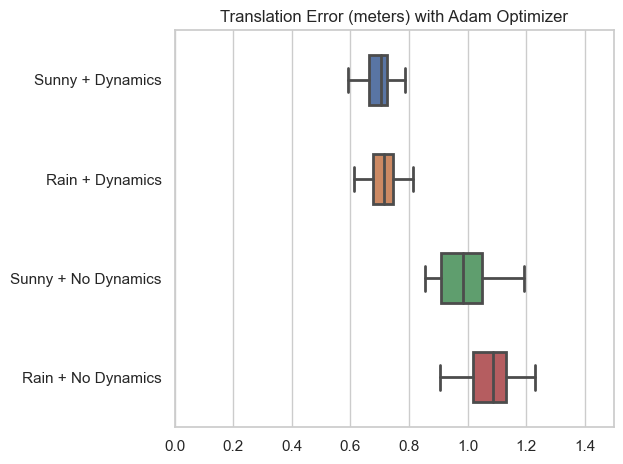

In [122]:
# plot the results
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Example error lists

# Combine the error lists
# data = [sd_translation_error_list,  rd_translation_error_list, snd_translation_error_list,rnd_translation_error_list]
data = [sd_t_adam,rd_t_adam,snd_t_adam,rnd_t_adam]
# labels = ['Sunny Dynamics', 'Rain Dynamics', 'Sunny No Dynamics', 'Rain No Dynamics'
labels = ['Sunny + Dynamics', 'Rain + Dynamics', 'Sunny + No Dynamics', 'Rain + No Dynamics']

sns.set(style='whitegrid')
ax = sns.boxplot(data=data, width=0.5, linewidth=2, orient='h', showfliers=False, whis=1.2)

# Customize box infills with different patterns
box_patterns = ['/', '.', '\\', '*']
for i, box in enumerate(ax.artists):
    box.set_edgecolor('black')
    box.set_facecolor('none')
    box.set_hatch(box_patterns[i])

# Set the y-axis labels
ax.set_yticklabels(labels)
ax.set_xlim(0, 1.5)
# Calculate means, variances, and standard deviations
means = [np.mean(error) for error in data]
variances = [np.var(error) for error in data]
stds = [np.std(error) for error in data]

# Print the statistics
print("Means:", means)
print("Variances:", variances)
print("Standard Deviations:", stds)

# Show the plot
plt.title('Translation Error (meters) with Adam Optimizer')
plt.tight_layout()
# plt.savefig('report/ab_adam_t.png')
# plt.savefig('report/final_translation_error_3.png')
plt.show()

Means: [0.7349733765979722, 0.7702316707728154, 1.022997415888827, 1.0751568704317793]
Variances: [0.003624859279819688, 0.0004822345419375959, 0.026607296312674136, 0.01281587801038839]
Standard Deviations: [0.0602068042651301, 0.02195983929671608, 0.16311743105098894, 0.11320723479702342]


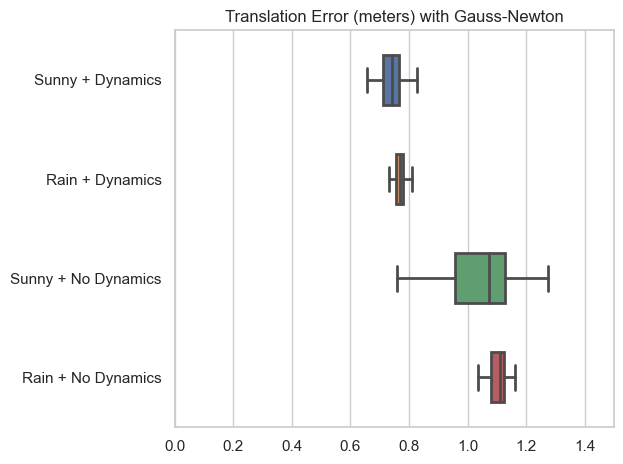

In [120]:
# plot the results
import matplotlib.pyplot as plt
# plot the results
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Example error lists

# Combine the error lists
# data = [sd_translation_error_list,  rd_translation_error_list, snd_translation_error_list,rnd_translation_error_list]
data = [sd_t_gauss,rd_t_gauss,snd_t_gauss,rnd_t_gauss]
# labels = ['Sunny Dynamics', 'Rain Dynamics', 'Sunny No Dynamics', 'Rain No Dynamics'
labels = ['Sunny + Dynamics', 'Rain + Dynamics', 'Sunny + No Dynamics', 'Rain + No Dynamics']

sns.set(style='whitegrid')
ax = sns.boxplot(data=data, width=0.5, linewidth=2, orient='h', showfliers=False, whis=1.2)

# Customize box infills with different patterns
box_patterns = ['/', '.', '\\', '*']
for i, box in enumerate(ax.artists):
    box.set_edgecolor('black')
    box.set_facecolor('none')
    box.set_hatch(box_patterns[i])

# Set the y-axis labels
ax.set_yticklabels(labels)
ax.set_xlim(0, 1.5)
# Calculate means, variances, and standard deviations
means = [np.mean(error) for error in data]
variances = [np.var(error) for error in data]
stds = [np.std(error) for error in data]

# Print the statistics
print("Means:", means)
print("Variances:", variances)
print("Standard Deviations:", stds)

# Show the plot
plt.title('Translation Error (meters) with Gauss-Newton')
plt.tight_layout()
# plt.savefig('report/ab_gauss_t.png')
# plt.savefig('report/final_translation_error_3.png')
plt.show()

In [123]:
# adam errors translation 
adam_t_errors = np.concatenate((sd_t_adam,rd_t_adam,snd_t_adam,rnd_t_adam))
# gauss errors translation
gauss_t_errors = np.concatenate((sd_t_gauss,rd_t_gauss,snd_t_gauss,rnd_t_gauss))

adam_mean_t_error= np.mean(adam_t_errors)
gauss_mean_t_error= np.mean(gauss_t_errors)

print("adam_mean_t_error", adam_mean_t_error)
print("gauss_mean_t_error", gauss_mean_t_error)
print("var_adam", np.var(adam_t_errors))
print("var_gauss", np.var(gauss_t_errors))

adam_mean_t_error 0.8640156886221775
gauss_mean_t_error 0.9008398334228485
var_adam 0.033819437690860384
var_gauss 0.033352336535195294


In [90]:
# show image example 
K, image_q, image_0, image_1, depth_q, depth_0, depth_1,  transform_0q, transform_1q, transform_10 = next(iter(dataloader_sunny_dynamics))

In [91]:
#estimate using adam
guess = torch.zeros(len(K), 6)

image_optimizer = AdamImageOptimizer(K.float(), image_0, depth_0)

result_0q = image_optimizer.forward(guess.float(), image_q.float(), iterations=32)
transform_0q_est_adam = transform_from_params(result_0q)

In [92]:
# estimate using gauss newton
guess = torch.zeros(len(K), 6).float()

image_optimizer = GaussNewtonImageOptimizer(K.float(), image_0.float(), depth_0.float())

result_0q = image_optimizer.forward(guess.float(), image_q.float(), iterations=32)
transform_0q_est_gauss = transform_from_params(result_0q)

# translation_error, rotation_error = errors(transform_0q_est, transform_0q)

c:\Users\28340\anaconda3\envs\tcl\lib\site-packages\torch\_functorch\deprecated.py:85: UserWarning: We've integrated functorch into PyTorch. As the final step of the integration, functorch.jacfwd is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use torch.func.jacfwd instead; see the PyTorch 2.0 release notes and/or the torch.func migration guide for more details https://pytorch.org/docs/master/func.migrating.html
  warn_deprecated('jacfwd')


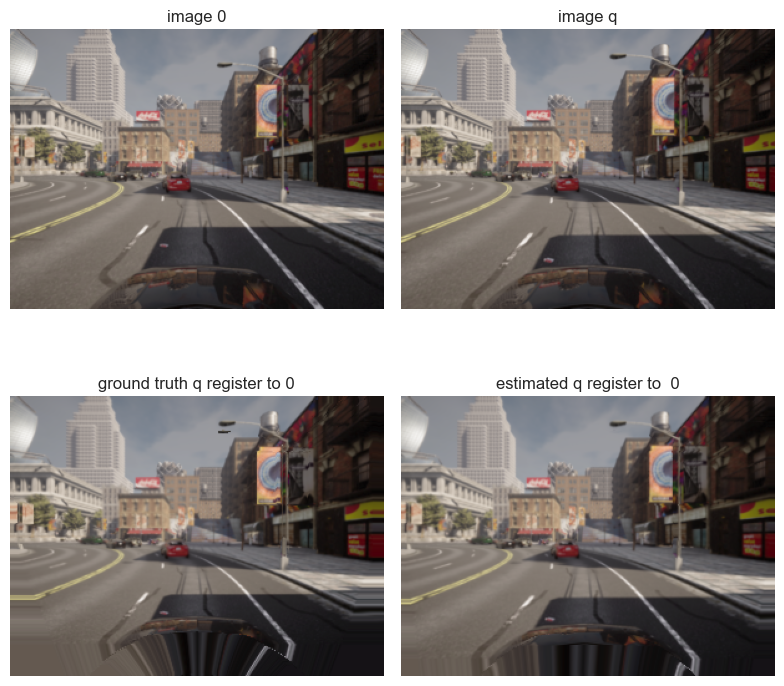

In [96]:
# show images
image_0q_est_gauss = resample(depth_0.float(), K.float(), transform_0q_est_gauss.float(), image_q.float()).squeeze()
image_0q_est_adam = resample(depth_0.float(), K.float(), transform_0q_est_adam.float(), image_q.float()).squeeze()
fig, axs = plt.subplots(2, 2, figsize=(8, 8))
for a in axs.ravel():
    a.axis('off')
axs[0, 0].set_title('image 0')
axs[0, 1].set_title('image q')
axs[1, 0].set_title('ground truth q register to 0')
axs[1, 1].set_title('estimated q register to  0')
axs[0, 0].imshow(image_0[0].permute(1,2,0))
axs[0, 1].imshow(image_q[0].permute(1,2,0))
axs[1, 0].imshow(image_0q_est_gauss.permute(1,2,0))
axs[1, 1].imshow(image_0q_est_adam.permute(1,2,0).detach().numpy())
plt.tight_layout()
plt.show()

In [133]:
# show test sets

d_rain= np.load("testset/test_rain_dynamics_417.npz")
nd_rain = np.load("testset/test_rain_noDynamics_417.npz")
d_sunny = np.load("testset/test_sunny_dynamics_417.npz")
nd_sunny = np.load("testset/test_sunny_noDynamics_417.npz")


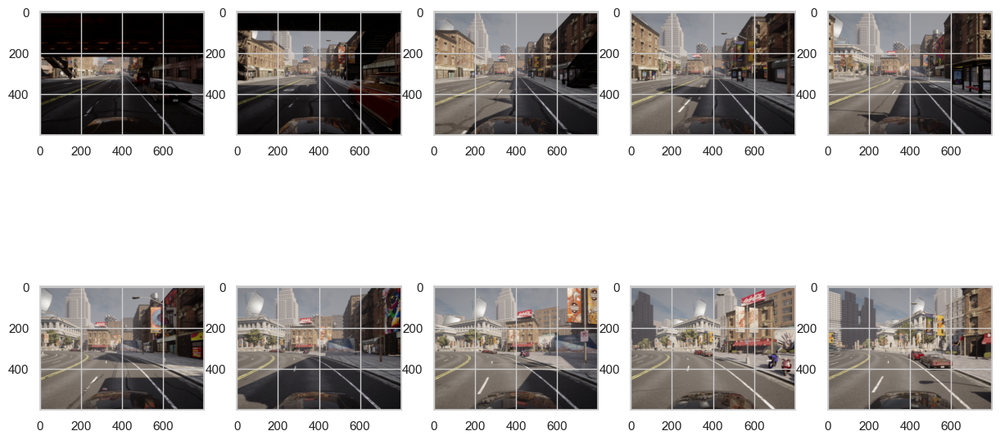

In [136]:
# show iamges 
fig,axs = plt.subplots(2,5,figsize=(15,8))
axs[0,0].imshow(  nd_sunny['rgbs'][0])
axs[0,1].imshow(  nd_sunny['rgbs'][10])
axs[0,2].imshow(nd_sunny['rgbs'][20])
axs[0,3].imshow(nd_sunny['rgbs'][30])
axs[0,4].imshow(nd_sunny['rgbs'][40])
axs[1,0].imshow(  nd_sunny['rgbs'][60-10])
axs[1,1].imshow(  nd_sunny['rgbs'][70-10])
axs[1,2].imshow(nd_sunny['rgbs'][80-10])
axs[1,3].imshow(nd_sunny['rgbs'][90-10])
axs[1,4].imshow(nd_sunny['rgbs'][100-10])




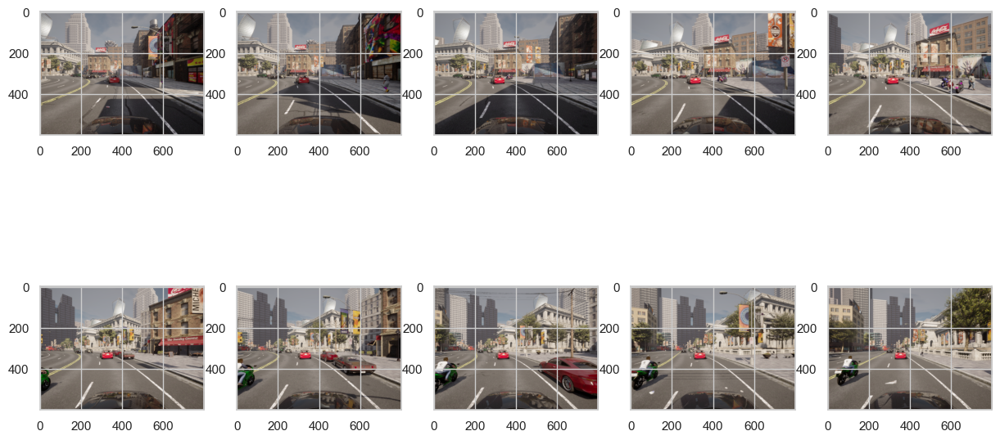

In [134]:
fig,axs= plt.subplots(2,5,figsize=(15,8))
axs[0,0].imshow(  d_sunny['rgbs'][0])
axs[0,1].imshow(  d_sunny['rgbs'][10])
axs[0,2].imshow(d_sunny['rgbs'][20])
axs[0,3].imshow(d_sunny['rgbs'][30])
axs[0,4].imshow(d_sunny['rgbs'][40])
axs[1,0].imshow(  d_sunny['rgbs'][60-10])
axs[1,1].imshow(  d_sunny['rgbs'][70-10])
axs[1,2].imshow(d_sunny['rgbs'][80-10])
axs[1,3].imshow(d_sunny['rgbs'][90-10])
axs[1,4].imshow(d_sunny['rgbs'][100-10])


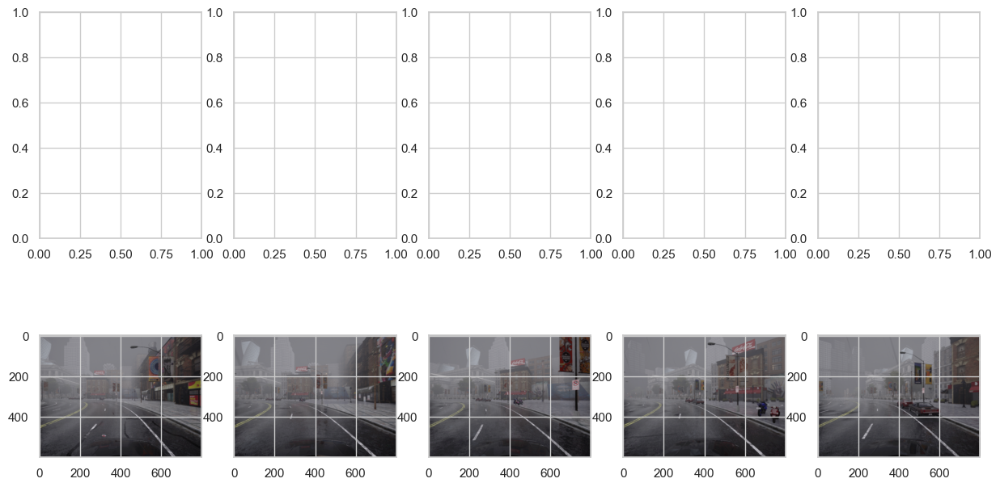

In [139]:
# show iamges 
fig,axs = plt.subplots(2,5,figsize=(15,8))
# axs[0,0].imshow(  nd_rain['rgbs'][0])
# axs[0,1].imshow(  nd_rain['rgbs'][10])
# axs[0,2].imshow(nd_rain['rgbs'][20])
# axs[0,3].imshow(nd_rain['rgbs'][30])
# axs[0,4].imshow(nd_rain['rgbs'][40])
axs[1,0].imshow(  nd_rain['rgbs'][60-10])
axs[1,1].imshow(  nd_rain['rgbs'][70-10])
axs[1,2].imshow(nd_rain['rgbs'][80-10])
axs[1,3].imshow(nd_rain['rgbs'][90-10])
axs[1,4].imshow(nd_rain['rgbs'][100-10])




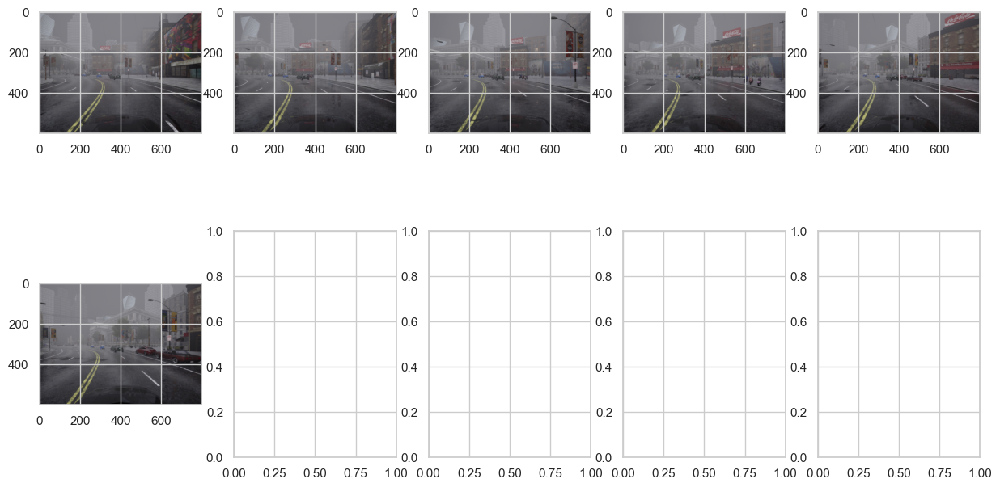

In [140]:
# show iamges 
fig,axs = plt.subplots(2,5,figsize=(15,8))
axs[0,0].imshow(  d_rain['rgbs'][0])
axs[0,1].imshow(  d_rain['rgbs'][10])
axs[0,2].imshow(d_rain['rgbs'][20])
axs[0,3].imshow(d_rain['rgbs'][30])
axs[0,4].imshow(d_rain['rgbs'][40])
axs[1,0].imshow(  d_rain['rgbs'][60-10])
# axs[1,1].imshow(  d_rain['rgbs'][70-10])
# axs[1,2].imshow(d_rain['rgbs'][80-10])
# axs[1,3].imshow(d_rain['rgbs'][90-10])
# axs[1,4].imshow(d_rain['rgbs'][100-10])




In [141]:
# test 
d_rain_dynamics_rgb_test = d_rain['rgbs'][0:50]
d_rain_dynamics_depth_test = d_rain['depths'][0:50]
d_rain_dynamics_transforms_test = d_rain['transforms'][0:50]

d_sunny_dynamics_rgb_test = d_sunny['rgbs'][0:50]
d_sunny_dynamics_depth_test = d_sunny['depths'][0:50]
d_sunny_dynamics_transforms_test = d_sunny['transforms'][0:50]

d_rain_noDynamics_rgb_test = nd_rain['rgbs'][50:90]
d_rain_noDynamics_depth_test = nd_rain['depths'][50:90]
d_rain_noDynamics_transforms_test = nd_rain['transforms'][50:90]

d_sunny_noDynamics_rgb_test = nd_sunny['rgbs'][50:90]
d_sunny_noDynamics_depth_test = nd_sunny['depths'][50:90]
d_sunny_noDynamics_transforms_test = nd_sunny['transforms'][50:90]

# rgb_test =np.concatenate((d_rain['rgbs'][350:400], d_sunny['rgbs'][350:400], nd_rain['rgbs'][350:400], nd_sunny['rgbs'][:250]), axis=0)
# depth_test =np.concatenate((d_rain['depths'][:350], d_sunny['depths'][:350], nd_rain['depths'][:350], nd_sunny['depths'][:250]), axis=0)
K = d_rain['K']
# transforms_test = np.concatenate((d_rain['transforms'][:350], d_sunny['transforms'][:350], nd_rain['transforms'][:350], nd_sunny['transforms'][:250]), axis=0)

In [142]:
# save test 
np.savez_compressed('test_rain_dynamics_0424', rgbs=d_rain_dynamics_rgb_test, depths=d_rain_dynamics_depth_test, K=K, transforms=d_rain_dynamics_transforms_test)
np.savez_compressed('test_sunny_dynamics_0424', rgbs=d_sunny_dynamics_rgb_test, depths=d_sunny_dynamics_depth_test, K=K, transforms=d_sunny_dynamics_transforms_test)
np.savez_compressed('test_rain_noDynamics_0424', rgbs=d_rain_noDynamics_rgb_test, depths=d_rain_noDynamics_depth_test, K=K, transforms=d_rain_noDynamics_transforms_test)
np.savez_compressed('test_sunny_noDynamics_0424', rgbs=d_sunny_noDynamics_rgb_test, depths=d_sunny_noDynamics_depth_test, K=K, transforms=d_sunny_noDynamics_transforms_test)

### Test set prepare

In [2]:
test_rain_dynamics = np.load("test_rain_dynamics_0424.npz")
test_rain_nodynamics = np.load("test_rain_noDynamics_0424.npz")
test_sunny_dynamics = np.load("test_sunny_dynamics_0424.npz")
test_sunny_nodynamics = np.load("test_sunny_noDynamics_0424.npz")

(-0.5, 799.5, 599.5, -0.5)

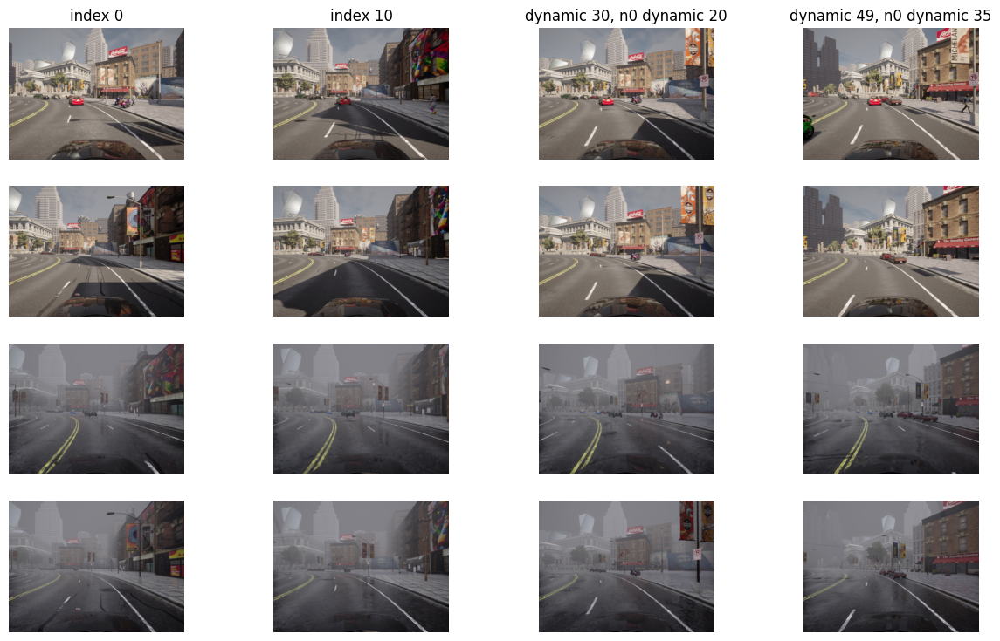

In [7]:
# show images in test 
fig,axs = plt.subplots(4,4,figsize=(15,9))
axs[0,0].set_title('index 0')
axs[0,1].set_title('index 10')
axs[0,2].set_title('dynamic 30, n0 dynamic 20')
axs[0,3].set_title('dynamic 49, n0 dynamic 35')
axs[0,0].imshow(test_sunny_dynamics['rgbs'][0])
axs[0,1].imshow(test_sunny_dynamics['rgbs'][10])
axs[0,2].imshow(test_sunny_dynamics['rgbs'][30])
axs[0,3].imshow(test_sunny_dynamics['rgbs'][49])
axs[1,0].imshow(test_sunny_nodynamics['rgbs'][0])
axs[1,1].imshow(test_sunny_nodynamics['rgbs'][10])
axs[1,2].imshow(test_sunny_nodynamics['rgbs'][20])
axs[1,3].imshow(test_sunny_nodynamics['rgbs'][35])
axs[2,0].imshow(test_rain_dynamics['rgbs'][0])
axs[2,1].imshow(test_rain_dynamics['rgbs'][10])
axs[2,2].imshow(test_rain_dynamics['rgbs'][25])
axs[2,3].imshow(test_rain_dynamics['rgbs'][45])
axs[3,0].imshow(test_rain_nodynamics['rgbs'][0])
axs[3,1].imshow(test_rain_nodynamics['rgbs'][10])
axs[3,2].imshow(test_rain_nodynamics['rgbs'][20])
axs[3,3].imshow(test_rain_nodynamics['rgbs'][35])
axs[0,0].axis('off')
axs[0,1].axis('off')
axs[0,2].axis('off')
axs[0,3].axis('off')
axs[1,0].axis('off')
axs[1,1].axis('off')
axs[1,2].axis('off')
axs[1,3].axis('off')
axs[2,0].axis('off')
axs[2,1].axis('off')
axs[2,2].axis('off')
axs[2,3].axis('off')
axs[3,0].axis('off')
axs[3,1].axis('off')
axs[3,2].axis('off')
axs[3,3].axis('off')


In [156]:
diffarray = np.zeros((len(test_sunny_dynamics['rgbs']), len(test_sunny_nodynamics['rgbs'])))
for i in range(len(test_sunny_dynamics['rgbs'])):
    for j in range(len(test_sunny_nodynamics['rgbs'])):
        # calculate the difference between two images
        imagei = test_sunny_dynamics['rgbs'][i]
        imagej = test_sunny_nodynamics['rgbs'][j]
        diff = np.sum(np.abs(imagei -imagej))
        diffarray[i,j] = diff



In [157]:
import numpy as np

# Create a sample m by n array

# Find the smallest 10 values and their indices
num_values = 10
flattened_array = diffarray.flatten()
sorted_indices = np.argpartition(flattened_array, num_values)[:num_values]
sorted_values = np.partition(flattened_array, num_values)[:num_values]

# Get the smallest 10 values' indices in the original 2D array
row_indices, col_indices = np.unravel_index(sorted_indices, diffarray.shape)

# Print the results
print("Original array:")
print(diffarray)
print("\nSmallest 10 values:")
print(sorted_values)
print("\nCorresponding indices (row, col):")
for i in range(num_values):
    print(f"Value {i+1}: ({row_indices[i]}, {col_indices[i]})")


Original array:
[[1.64786738e+08 1.75629181e+08 1.86675324e+08 ... 1.99779586e+08
  1.99751744e+08 2.01548626e+08]
 [1.46428051e+08 1.73976030e+08 1.83167197e+08 ... 1.98568547e+08
  1.98312865e+08 2.00162227e+08]
 [1.59072348e+08 1.65068455e+08 1.78986662e+08 ... 1.95296556e+08
  1.95928426e+08 1.97164668e+08]
 ...
 [1.59247625e+08 1.59673172e+08 1.61674323e+08 ... 1.60368857e+08
  1.61173527e+08 1.64029225e+08]
 [1.60311892e+08 1.62525343e+08 1.63247774e+08 ... 1.60179492e+08
  1.60418914e+08 1.65200500e+08]
 [1.57975238e+08 1.60188945e+08 1.62505744e+08 ... 1.62093462e+08
  1.62759380e+08 1.62935014e+08]]

Smallest 10 values:
[1.40090164e+08 1.39358137e+08 1.38641117e+08 1.37655390e+08
 1.39565688e+08 1.39143040e+08 1.40231958e+08 1.38561687e+08
 1.40239285e+08 1.40767255e+08]

Corresponding indices (row, col):
Value 1: (36, 7)
Value 2: (38, 9)
Value 3: (37, 7)
Value 4: (37, 8)
Value 5: (40, 5)
Value 6: (37, 9)
Value 7: (38, 7)
Value 8: (38, 8)
Value 9: (36, 8)
Value 10: (37, 10)


In [30]:
len(test_sunny_nodynamics['rgbs'])

40

Text(0.5, 1.0, 'dynamics index 7')

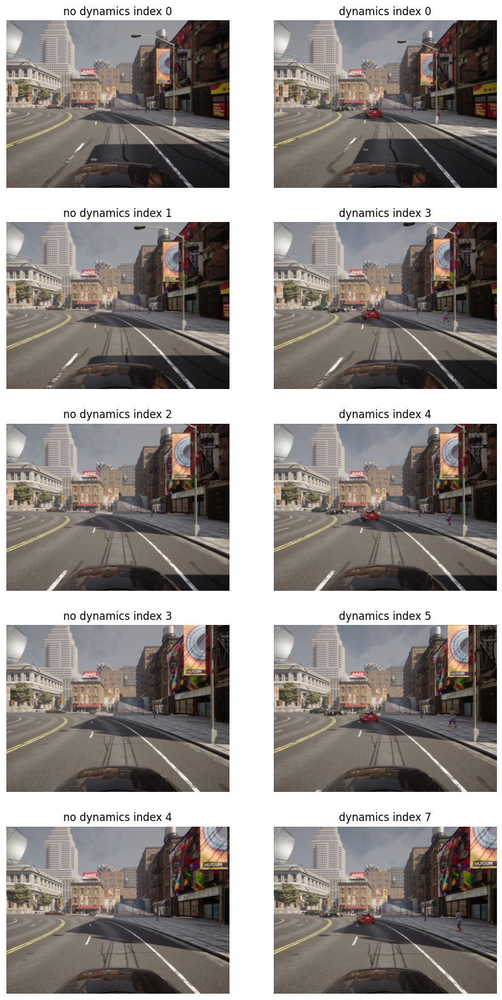

In [28]:
fig,ax = plt.subplots(5,2,figsize = (10,20))
plus = 0
ax[0,0].imshow(test_sunny_nodynamics['rgbs'][0+plus])
ax[0,1].imshow(test_sunny_dynamics['rgbs'][0+plus])
ax[1,0].imshow(test_sunny_nodynamics['rgbs'][1+plus])
ax[1,1].imshow(test_sunny_dynamics['rgbs'][3])
ax[2,0].imshow(test_sunny_nodynamics['rgbs'][2+plus])
ax[2,1].imshow(test_sunny_dynamics['rgbs'][4])
ax[3,0].imshow(test_sunny_nodynamics['rgbs'][3+plus])
ax[3,1].imshow(test_sunny_dynamics['rgbs'][5])
ax[4,0].imshow(test_sunny_nodynamics['rgbs'][4+plus])
ax[4,1].imshow(test_sunny_dynamics['rgbs'][7])
ax[0,0].axis('off')
ax[0,1].axis('off')
ax[1,0].axis('off')
ax[1,1].axis('off')
ax[2,0].axis('off')
ax[2,1].axis('off')
ax[3,0].axis('off')
ax[3,1].axis('off')
ax[4,0].axis('off')
ax[4,1].axis('off')
ax[0,0].set_title('no dynamics index 0')
ax[0,1].set_title('dynamics index 0')
ax[1,0].set_title('no dynamics index 1')
ax[1,1].set_title('dynamics index 3')
ax[2,0].set_title('no dynamics index 2')
ax[2,1].set_title('dynamics index 4')
ax[3,0].set_title('no dynamics index 3')
ax[3,1].set_title('dynamics index 5')
ax[4,0].set_title('no dynamics index 4')
ax[4,1].set_title('dynamics index 7')


Text(0.5, 1.0, 'dynamics index 14')

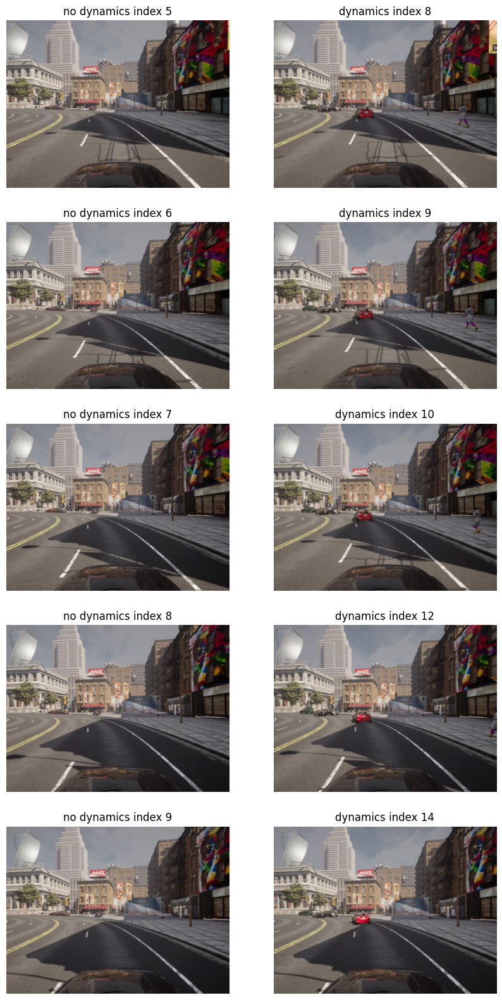

In [33]:
fig,ax = plt.subplots(5,2,figsize = (10,20))
plus = 5
ax[0,0].imshow(test_sunny_nodynamics['rgbs'][0+plus])
ax[0,1].imshow(test_sunny_dynamics['rgbs'][8])
ax[1,0].imshow(test_sunny_nodynamics['rgbs'][1+plus])
ax[1,1].imshow(test_sunny_dynamics['rgbs'][9])
ax[2,0].imshow(test_sunny_nodynamics['rgbs'][2+plus])
ax[2,1].imshow(test_sunny_dynamics['rgbs'][10])
ax[3,0].imshow(test_sunny_nodynamics['rgbs'][3+plus])
ax[3,1].imshow(test_sunny_dynamics['rgbs'][12])
ax[4,0].imshow(test_sunny_nodynamics['rgbs'][4+plus])
ax[4,1].imshow(test_sunny_dynamics['rgbs'][14])
ax[0,0].axis('off')
ax[0,1].axis('off')
ax[1,0].axis('off')
ax[1,1].axis('off')
ax[2,0].axis('off')
ax[2,1].axis('off')
ax[3,0].axis('off')
ax[3,1].axis('off')
ax[4,0].axis('off')
ax[4,1].axis('off')
ax[0,0].set_title('no dynamics index 5')
ax[0,1].set_title('dynamics index 8')
ax[1,0].set_title('no dynamics index 6')
ax[1,1].set_title('dynamics index 9')
ax[2,0].set_title('no dynamics index 7')
ax[2,1].set_title('dynamics index 10')
ax[3,0].set_title('no dynamics index 8')
ax[3,1].set_title('dynamics index 12')
ax[4,0].set_title('no dynamics index 9')
ax[4,1].set_title('dynamics index 14')



(-0.5, 799.5, 599.5, -0.5)

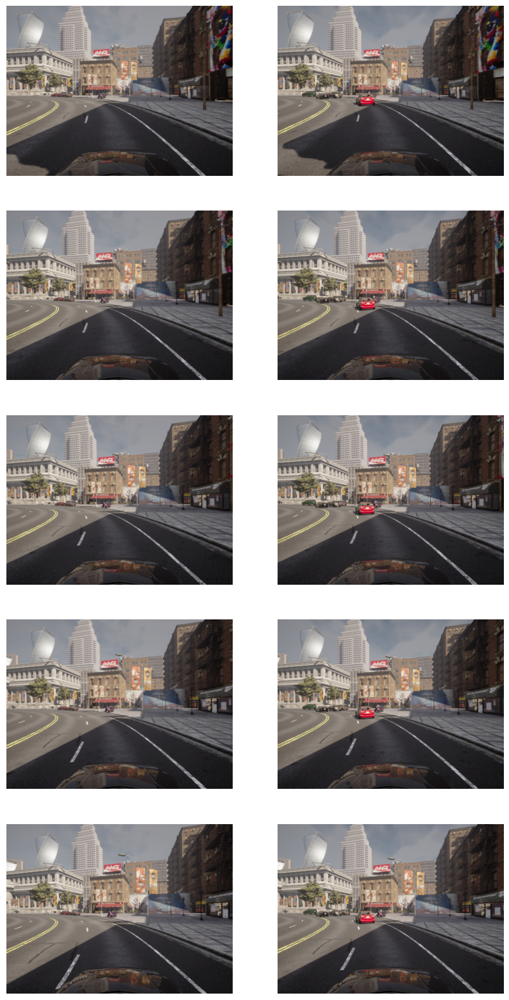

In [34]:
fig,ax = plt.subplots(5,2,figsize = (10,20))
plus = 10
ax[0,0].imshow(test_sunny_nodynamics['rgbs'][0+plus])
ax[0,1].imshow(test_sunny_dynamics['rgbs'][15])
ax[1,0].imshow(test_sunny_nodynamics['rgbs'][1+plus])
ax[1,1].imshow(test_sunny_dynamics['rgbs'][17])
ax[2,0].imshow(test_sunny_nodynamics['rgbs'][2+plus])
ax[2,1].imshow(test_sunny_dynamics['rgbs'][18])
ax[3,0].imshow(test_sunny_nodynamics['rgbs'][3+plus])
ax[3,1].imshow(test_sunny_dynamics['rgbs'][19])
ax[4,0].imshow(test_sunny_nodynamics['rgbs'][4+plus])
ax[4,1].imshow(test_sunny_dynamics['rgbs'][20])
ax[0,0].axis('off')
ax[0,1].axis('off')
ax[1,0].axis('off')
ax[1,1].axis('off')
ax[2,0].axis('off')
ax[2,1].axis('off')
ax[3,0].axis('off')
ax[3,1].axis('off')
ax[4,0].axis('off')
ax[4,1].axis('off')
ax[0,0].set_title('no dynamics index 10')
ax[0,1].set_title('dynamics index 15')
ax[1,0].set_title('no dynamics index 11')
ax[1,1].set_title('dynamics index 17')
ax[2,0].set_title('no dynamics index 12')
ax[2,1].set_title('dynamics index 18')
ax[3,0].set_title('no dynamics index 13')
ax[3,1].set_title('dynamics index 19')
ax[4,0].set_title('no dynamics index 14')
ax[4,1].set_title('dynamics index 20')


Text(0.5, 1.0, 'dynamics index 28')

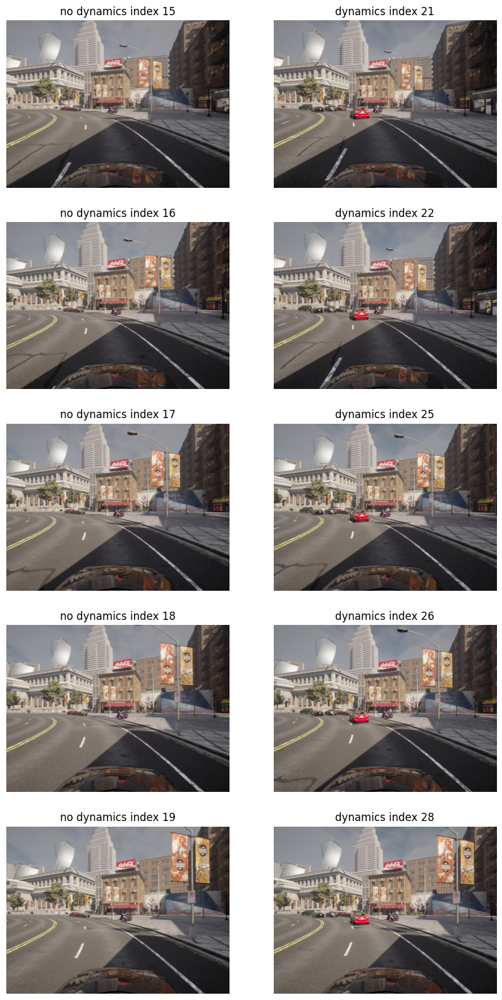

In [47]:
fig,ax = plt.subplots(5,2,figsize = (10,20))
plus = 15
ax[0,0].imshow(test_sunny_nodynamics['rgbs'][0+plus])
ax[0,1].imshow(test_sunny_dynamics['rgbs'][21])
ax[1,0].imshow(test_sunny_nodynamics['rgbs'][1+plus])
ax[1,1].imshow(test_sunny_dynamics['rgbs'][22])
ax[2,0].imshow(test_sunny_nodynamics['rgbs'][2+plus])
ax[2,1].imshow(test_sunny_dynamics['rgbs'][25])
ax[3,0].imshow(test_sunny_nodynamics['rgbs'][3+plus])
ax[3,1].imshow(test_sunny_dynamics['rgbs'][26])
ax[4,0].imshow(test_sunny_nodynamics['rgbs'][4+plus])
ax[4,1].imshow(test_sunny_dynamics['rgbs'][28])
ax[0,0].axis('off')
ax[0,1].axis('off')
ax[1,0].axis('off')
ax[1,1].axis('off')
ax[2,0].axis('off')
ax[2,1].axis('off')
ax[3,0].axis('off')
ax[3,1].axis('off')
ax[4,0].axis('off')
ax[4,1].axis('off')
ax[0,0].set_title('no dynamics index 15')
ax[0,1].set_title('dynamics index 21')
ax[1,0].set_title('no dynamics index 16')
ax[1,1].set_title('dynamics index 22')
ax[2,0].set_title('no dynamics index 17')
ax[2,1].set_title('dynamics index 25')
ax[3,0].set_title('no dynamics index 18')
ax[3,1].set_title('dynamics index 26')
ax[4,0].set_title('no dynamics index 19')
ax[4,1].set_title('dynamics index 28')

Text(0.5, 1.0, 'dynamics index 35')

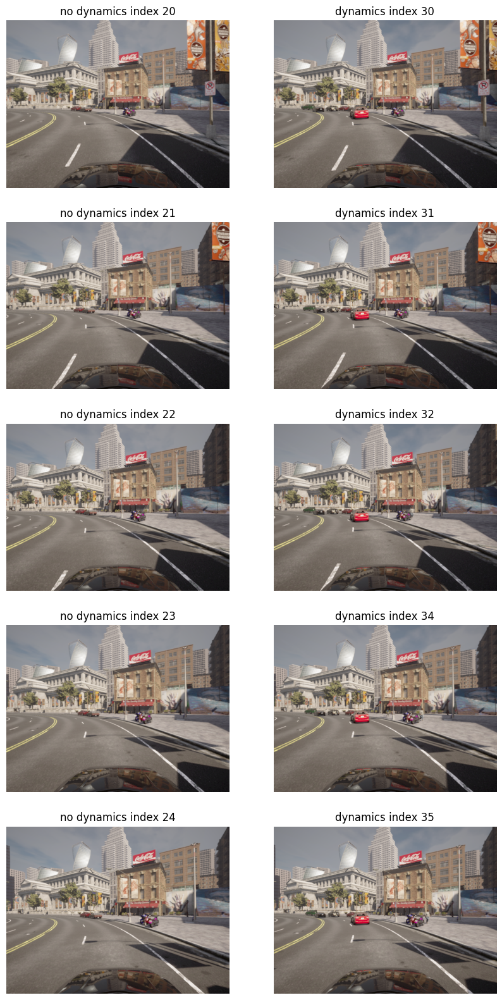

In [42]:
fig,ax = plt.subplots(5,2,figsize = (10,20))
plus = 20
ax[0,0].imshow(test_sunny_nodynamics['rgbs'][0+plus])
ax[0,1].imshow(test_sunny_dynamics['rgbs'][30])
ax[1,0].imshow(test_sunny_nodynamics['rgbs'][1+plus])
ax[1,1].imshow(test_sunny_dynamics['rgbs'][31])
ax[2,0].imshow(test_sunny_nodynamics['rgbs'][2+plus])
ax[2,1].imshow(test_sunny_dynamics['rgbs'][32])
ax[3,0].imshow(test_sunny_nodynamics['rgbs'][3+plus])
ax[3,1].imshow(test_sunny_dynamics['rgbs'][34])
ax[4,0].imshow(test_sunny_nodynamics['rgbs'][4+plus])
ax[4,1].imshow(test_sunny_dynamics['rgbs'][35])
ax[0,0].axis('off')
ax[0,1].axis('off')
ax[1,0].axis('off')
ax[1,1].axis('off')
ax[2,0].axis('off')
ax[2,1].axis('off')
ax[3,0].axis('off')
ax[3,1].axis('off')
ax[4,0].axis('off')
ax[4,1].axis('off')
ax[0,0].set_title('no dynamics index 20')
ax[0,1].set_title('dynamics index 30')
ax[1,0].set_title('no dynamics index 21')
ax[1,1].set_title('dynamics index 31')
ax[2,0].set_title('no dynamics index 22')
ax[2,1].set_title('dynamics index 32')
ax[3,0].set_title('no dynamics index 23')
ax[3,1].set_title('dynamics index 34')
ax[4,0].set_title('no dynamics index 24')
ax[4,1].set_title('dynamics index 35')

Text(0.5, 1.0, 'dynamics index 42')

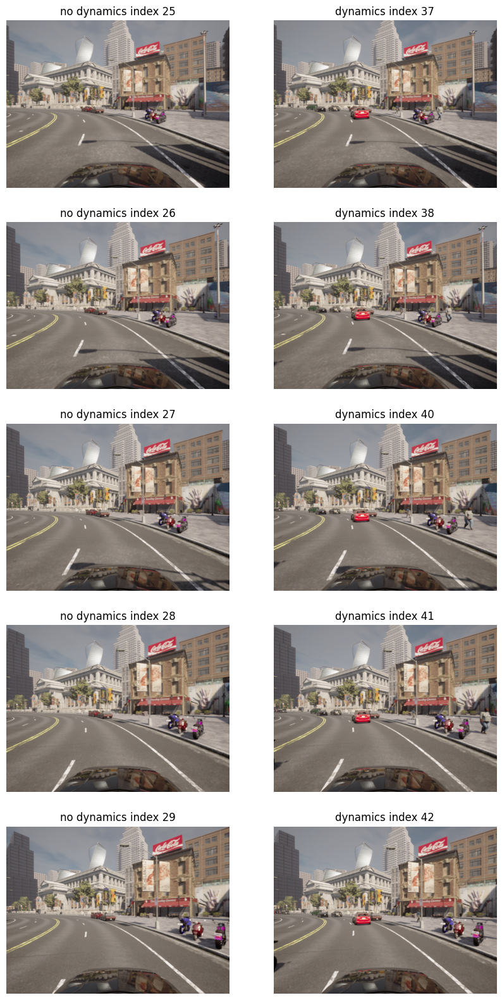

In [60]:
fig,ax = plt.subplots(5,2,figsize = (10,20))
plus = 25
ax[0,0].imshow(test_sunny_nodynamics['rgbs'][0+plus])
ax[0,1].imshow(test_sunny_dynamics['rgbs'][37])
ax[1,0].imshow(test_sunny_nodynamics['rgbs'][1+plus])
ax[1,1].imshow(test_sunny_dynamics['rgbs'][38])
ax[2,0].imshow(test_sunny_nodynamics['rgbs'][2+plus])
ax[2,1].imshow(test_sunny_dynamics['rgbs'][40])
ax[3,0].imshow(test_sunny_nodynamics['rgbs'][3+plus])
ax[3,1].imshow(test_sunny_dynamics['rgbs'][41])
ax[4,0].imshow(test_sunny_nodynamics['rgbs'][4+plus])
ax[4,1].imshow(test_sunny_dynamics['rgbs'][42])
ax[0,0].axis('off')
ax[0,1].axis('off')
ax[1,0].axis('off')
ax[1,1].axis('off')
ax[2,0].axis('off')
ax[2,1].axis('off')
ax[3,0].axis('off')
ax[3,1].axis('off')
ax[4,0].axis('off')
ax[4,1].axis('off')
ax[0,0].set_title('no dynamics index 25')
ax[0,1].set_title('dynamics index 37')
ax[1,0].set_title('no dynamics index 26')
ax[1,1].set_title('dynamics index 38')
ax[2,0].set_title('no dynamics index 27')
ax[2,1].set_title('dynamics index 40')
ax[3,0].set_title('no dynamics index 28')
ax[3,1].set_title('dynamics index 41')
ax[4,0].set_title('no dynamics index 29')
ax[4,1].set_title('dynamics index 42')


In [56]:
# matched pairs
# test 

d_sunny_dynamics_rgb_test_matched = test_sunny_dynamics['rgbs'][[0,3,4,5,7,8,9,10,12,14,15,17,18,19,20,21,22,25,26,28,30,31,32,34,35,37,38,40,41,42]]
d_sunny_dynamics_depth_test_matched = test_sunny_dynamics['depths'][[0,3,4,5,7,8,9,10,12,14,15,17,18,19,20,21,22,25,26,28,30,31,32,34,35,37,38,40,41,42]]
d_sunny_dynamics_transforms_test_matched = test_sunny_dynamics['transforms'][[0,3,4,5,7,8,9,10,12,14,15,17,18,19,20,21,22,25,26,28,30,31,32,34,35,37,38,40,41,42]]


d_sunny_noDynamics_rgb_test_matched = test_sunny_nodynamics['rgbs'][0:30]
d_sunny_noDynamics_depth_test_matched = test_sunny_nodynamics['depths'][0:30]
d_sunny_noDynamics_transforms_test_matched = test_sunny_nodynamics['transforms'][0:30]

# rgb_test =np.concatenate((d_rain['rgbs'][350:400], d_sunny['rgbs'][350:400], nd_rain['rgbs'][350:400], nd_sunny['rgbs'][:250]), axis=0)
# depth_test =np.concatenate((d_rain['depths'][:350], d_sunny['depths'][:350], nd_rain['depths'][:350], nd_sunny['depths'][:250]), axis=0)
K = test_sunny_nodynamics['K']
# transforms_test = np.concatenate((d_rain['transforms'][:350], d_sunny['transforms'][:350], nd_rain['transforms'][:350], nd_sunny['transforms'][:250]), axis=0)

In [ ]:
fig,axs = plt.subplots(1,2,figsize=(10,8))
axs[0] 

In [57]:
np.savez_compressed('test_ablation_sunny_dynamics_matched.npz', rgbs=d_sunny_dynamics_rgb_test_matched, depths=d_sunny_dynamics_depth_test_matched, transforms=d_sunny_dynamics_transforms_test_matched, K=K)

In [59]:
np.savez_compressed('test_ablation_sunny_nodynamics_matched.npz', rgbs=d_sunny_noDynamics_rgb_test_matched, depths=d_sunny_noDynamics_depth_test_matched, transforms=d_sunny_noDynamics_transforms_test_matched, K=K)